In [1]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc
from collections import Counter
import re
from sklearn import preprocessing

In [2]:
train = pd.read_csv('train.csv')
test1 = pd.read_csv('test1.csv')
# labels = train['label']
df_train = train.drop(['Unnamed: 0'], axis=1)
df_test = test1.drop(['Unnamed: 0'], axis=1)
for col in ["android_id","apptype","carrier","ntt","media_id","cus_type","package",'fea1_hash',"location"]:
    df_train[col]=df_train[col].astype("object")
    df_test[col]=df_test[col].astype("object")

for col in ["fea_hash"]:
    df_train[col]=df_train[col].map(lambda x:0 if len(str(x))>16 else int(x))
    df_test[col]=df_test[col].map(lambda x:0 if len(str(x))>16 else int(x))

# df_train["timestamp"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01'))
# df_test["timestamp"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01'))

df_train.set_index("sid",drop=True,inplace=True)
df_test.set_index("sid",drop=True,inplace=True)
df_train.dtypes

android_id     object
apptype        object
carrier        object
dev_height    float64
dev_ppi       float64
dev_width     float64
label           int64
lan            object
media_id       object
ntt            object
os             object
osv            object
package        object
timestamp     float64
version        object
fea_hash        int64
location       object
fea1_hash      object
cus_type       object
dtype: object

In [3]:
df_train.head().T

sid,1438873,1185582,1555716,1093419,1400089
android_id,316361,135939,399254,68983,288999
apptype,1199,893,821,1004,1076
carrier,46000,0,0,46000,46000
dev_height,0,0,760,2214,2280
dev_ppi,0,0,0,0,0
dev_width,0,0,360,1080,1080
label,1,1,1,0,1
lan,NaN,NaN,NaN,NaN,zh-CN
media_id,104,19,559,129,64
ntt,6,6,0,2,2


In [4]:
def summary_stats_table(data):
    '''
    祖传代码：分类型按列的数据分布与异常值统计
    '''
    # 空值数量
    missing_counts = pd.DataFrame(data.isnull().sum())
    missing_counts.columns = ['count_null']

    # 数值列数据分布统计
    num_stats = data.select_dtypes(include=['int64','float64','int32']).describe().loc[['count','min','max','25%','50%','75%']].transpose()
    num_stats['dtype'] = data.select_dtypes(include=['int64','float64','int32']).dtypes.tolist()

    # 非数值列数据分布统计
    non_num_stats = data.select_dtypes(exclude=['int64','float64','int32']).describe().transpose()
    non_num_stats['dtype'] = data.select_dtypes(exclude=['int64','float64','int32']).dtypes.tolist()
    non_num_stats = non_num_stats.rename(columns={"first": "min", "last": "max"})

    # 聚合结果
    stats_merge = pd.concat([num_stats, non_num_stats], axis=0, join='outer', ignore_index=False, keys=None,
              levels=None, names=None, verify_integrity=False, copy=True, sort=False).fillna("").sort_values('dtype')

    column_order = ['dtype', 'count', 'count_null','unique','min','max','25%','50%','75%','top','freq']
    summary_stats = pd.merge(stats_merge, missing_counts, left_index=True, right_index=True, sort=False)[column_order]
    return(summary_stats)
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
label,int64,500000.0,0,,0,1,0,0,1,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
dev_height,float64,500000.0,0,,0,9024,720,1280,2040,,
dev_ppi,float64,500000.0,0,,0,720,0,0,0,,
dev_width,float64,500000.0,0,,0,8832,360,720,1080,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,500000.0,0,332,,,,,,48,14932
version,object,500000.0,0,22,,,,,,0,292156
package,object,500000.0,0,1950,,,,,,0,131906
osv,object,493439.0,6561,154,,,,,,8.1.0,151419


In [5]:
summary_stats_table(df_test)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
fea_hash,int64,150000.0,0,,0,4.29492e+09,1.02766e+09,2.08538e+09,3.18382e+09,,
dev_height,float64,150000.0,0,,0,8512,720,1280,2038,,
dev_ppi,float64,150000.0,0,,0,640,0,0,0,,
dev_width,float64,150000.0,0,,0,9024,360,720,1080,,
timestamp,float64,150000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,150000.0,0,332,,,,,,48,4496
version,object,150000.0,0,23,,,,,,0,88113
package,object,150000.0,0,1293,,,,,,0,39184
osv,object,148008.0,1992,130,,,,,,8.1.0,45224
os,object,150000.0,0,2,,,,,,android,91117


## 一、预处理

### 1.特征apptype label Encoder：对分类型特征值进行编码
发现df_test 中所有的apptype都会被df_train 包括

In [6]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

df_train.apptype=le.fit_transform(df_train.apptype)
df_train["apptype"]=df_train["apptype"].astype("object")

df_test.apptype=le.transform(df_test.apptype)
df_test["apptype"]=df_test["apptype"].astype("object")

### 2.特征carrier label Encoder：对分类型特征值进行编码
设备使用的运营商 0-未知, 46000-移动, 46001-联通, 46003-电信,-1当成未知

In [4]:
df_train.carrier.value_counts()

 46000.0    359409
 46001.0     43390
 0.0         40652
 46003.0     32294
-1.0         24255
Name: carrier, dtype: int64

In [5]:
df_test.carrier.value_counts()

 46000.0    107691
 46001.0     13083
 0.0         12160
 46003.0      9707
-1.0          7359
Name: carrier, dtype: int64

In [7]:
dict1={0.0:0, 46000.0:1, 46001.0:2, 46003.0:3,-1.0:-1}
df_train.carrier=df_train.carrier.map(dict1)
df_train["carrier"]=df_train["carrier"].astype("object")

df_test.carrier=df_test.carrier.map(dict1)
df_test["carrier"]=df_test["carrier"].astype("object")

### 3.dev_height	:设备高
0的数据过多(1/5)，怀疑是Nan的，不是整数的数据都是少数

In [8]:
df_train.dev_height.value_counts()

0.0       107014
1920.0     66944
760.0      38393
1280.0     32072
2340.0     29538
           ...  
1145.0         1
615.0          1
844.0          1
2845.0         1
717.0          1
Name: dev_height, Length: 798, dtype: int64

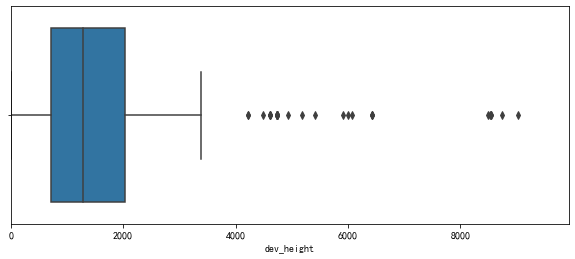

In [9]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_train.dev_height.min(), df_train.dev_height.max()*1.1)
sns.boxplot(x=df_train.dev_height)
plt.show()

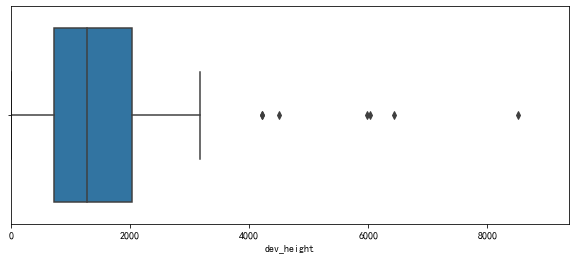

In [24]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_test.dev_height.min(), df_test.dev_height.max()*1.1)
sns.boxplot(x=df_test.dev_height)
plt.show()

### 4.dev_ppi:屏幕分辨率
0还是多(4/5)

In [25]:
df_train.dev_ppi.value_counts()

0.0      383291
480.0     58775
3.0       23543
2.0       12891
320.0      8498
          ...  
369.0         1
384.0         1
192.0         1
333.0         1
60.0          1
Name: dev_ppi, Length: 92, dtype: int64

In [110]:
# df_test.dev_ppi.value_counts()

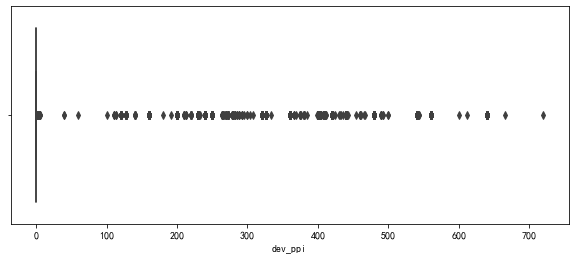

In [14]:
plt.figure(figsize=(10,4))
# x轴坐标范围
# plt.xlim(df_train.dev_ppi.min(), df_train.dev_ppi.max()*1.1)
sns.boxplot(x=df_train.dev_ppi)
plt.show()

### 5.dev_width	

In [26]:
df_train.dev_width.value_counts()

1080.0    209914
0.0       107011
360.0      76852
720.0      63317
393.0       6259
           ...  
1368.0         1
1361.0         1
1357.0         1
1354.0         1
686.0          1
Name: dev_width, Length: 346, dtype: int64

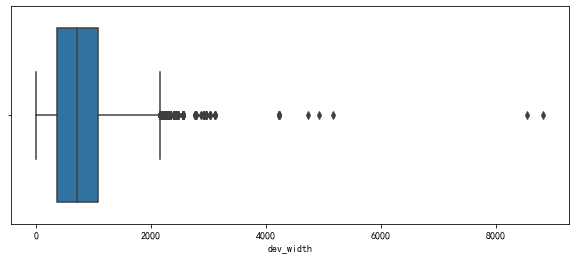

In [27]:
plt.figure(figsize=(10,4))
# x轴坐标范围
# plt.xlim(df_train.dev_ppi.min(), df_train.dev_ppi.max()*1.1)
sns.boxplot(x=df_train.dev_width)
plt.show()

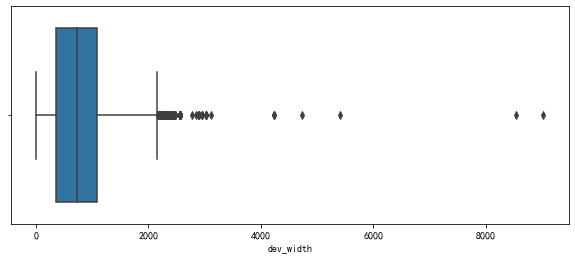

In [16]:
plt.figure(figsize=(10,4))
# x轴坐标范围
# plt.xlim(df_train.dev_ppi.min(), df_train.dev_ppi.max()*1.1)
sns.boxplot(x=df_test.dev_width)
plt.show()

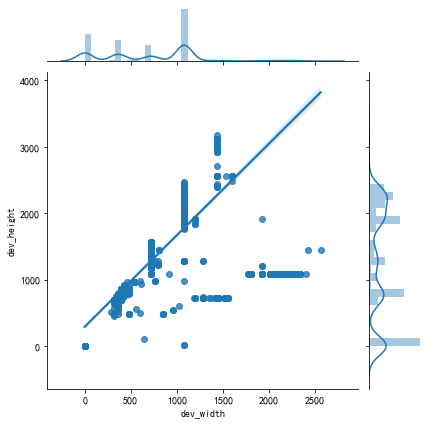

In [101]:
# sns.jointplot(x="dev_width",y="dev_height",data=df_train[:10000],kind="reg");

### 6.timestamp:时间戳,都是2019年6月的(2-9日)

In [10]:
df_train["Day"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.day
df_train["Hour"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.hour
df_train["minute"]=pd.to_datetime(df_train['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.minute

In [11]:
df_test["Day"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.day
df_test["Hour"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.hour
df_test["minute"]=pd.to_datetime(df_test['timestamp'],unit='ms',origin=pd.Timestamp('1970-01-01')).dt.minute

### 7.location:地理位置

In [12]:
gc.collect()

2458

In [13]:
# for num in df_test["location"].unique():
#     if num not in df_train["location"].unique():
#         print(num)

In [14]:
from sklearn import preprocessing
le2 = preprocessing.LabelEncoder()

df_train.location=le2.fit_transform(df_train.location)
df_train["location"]=df_train["location"].astype("object")

df_test.location=le2.transform(df_test.location)
df_test["location"]=df_test["location"].astype("object")

### 8.version:在下版本，有何贵干
test 多一个“20”,将20归于最多的0类

In [15]:
for num in df_test["version"].unique():
    if num not in df_train["version"].unique():
        print(num)
print("------")
for num in df_train["version"].unique():
    if num not in df_test["version"].unique():
        print(num)

20
------


In [16]:
df_test.version=df_test.version.replace("20","0")

In [17]:

le3 = preprocessing.LabelEncoder()

df_train.version=le3.fit_transform(df_train.version)
df_train["version"]=df_train["version"].astype("object")

df_test.version=le3.transform(df_test.version)
df_test["version"]=df_test["version"].astype("object")

### 9.lan
train 和test 的标志不一致

只规划大于10个的标志，其余的规划为UNK(包括Nan)

In [18]:
def process_lan(x):
    set1=set(['zh-CN', 'zh', 'cn', 'zh_CN', 'Zh-CN', 'zh-cn', 'ZH', 'CN', 'tw', 'en','zh_CN_#Hans', 'ko'])
    if x in set1:
        return x
    else:
        return "unk"

In [19]:
df_train["lan"]=df_train["lan"].apply(process_lan)
df_test["lan"]=df_test["lan"].apply(process_lan)

In [20]:
from sklearn import preprocessing
le4 = preprocessing.LabelEncoder()

df_train.lan=le4.fit_transform(df_train.lan)
df_train["lan"]=df_train["lan"].astype("object")

df_test.lan=le4.transform(df_test.lan)
df_test["lan"]=df_test["lan"].astype("object")

### 10.media_id:媒体信息，对外媒体ID

test 与train 非对应

非对应的id最高出现不超过13次

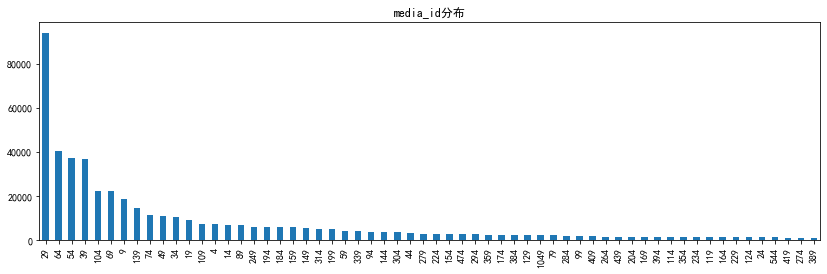

In [30]:
plt.figure(figsize=(14,4))
plt.title('media_id分布')
df_train["media_id"].value_counts().head(60).plot(kind="bar");

In [21]:
def cross_col(col):
    atrd=[]
    ated=[]
    for num in df_test[col].unique():
        if num not in df_train[col].unique():
            ated.append(num)
    for num in df_train[col].unique():
        if num not in df_test[col].unique():
            atrd.append(num)
    print("只存在test里:",ated)
    print("只存在train里:",atrd) 
cross_col("media_id")

只存在test里: [1124, 1504, 1474, 979, 1484, 1534, 1539, 1444]
只存在train里: [1044, 1284, 1404, 1184, 1349, 1289, 1314, 1329, 939, 784, 1129, 994, 1394, 1414, 1489, 1269, 1389, 1229, 1139, 1214, 1324, 1189, 1439, 1204, 1529, 1254, 1449, 969, 1099, 1319, 1429, 1434, 619, 1424, 1379, 984, 1104, 959, 1544, 989, 1499, 1199, 1239, 1219]


In [22]:
set2=set(df_train["media_id"].value_counts().head(60).index)
def process_media_id(x):
    if x in set2:
        return x
    else:
        return -1

In [23]:
df_train["media_id"]=df_train["media_id"].apply(process_media_id)
df_test["media_id"]=df_test["media_id"].apply(process_media_id)

In [24]:
from sklearn import preprocessing
le5 = preprocessing.LabelEncoder()

df_train.media_id=le5.fit_transform(df_train.media_id)
df_train["media_id"]=df_train["media_id"].astype("object")

df_test.media_id=le5.transform(df_test.media_id)
df_test["media_id"]=df_test["media_id"].astype("object")

In [25]:
cross_col("media_id")

只存在test里: []
只存在train里: []


### 11.ntt:网络类型 0-未知, 1-有线网, 2-WIFI, 3-蜂窝网络未知, 4-2G, 5-3G, 6–4G

In [26]:
cross_col("ntt")

只存在test里: []
只存在train里: [1.0]


In [27]:
df_train.ntt=df_train.ntt.replace(1.0,2.0)

In [28]:
from sklearn import preprocessing
le6 = preprocessing.LabelEncoder()

df_train.ntt=le6.fit_transform(df_train.ntt)
df_train["ntt"]=df_train["ntt"].astype("object")

df_test.ntt=le6.transform(df_test.ntt)
df_test["ntt"]=df_test["ntt"].astype("object")

### 12.os

In [29]:
cross_col("os")

只存在test里: []
只存在train里: []


In [30]:
df_train.os.value_counts()

android    303175
Android    196825
Name: os, dtype: int64

In [31]:
from sklearn import preprocessing
le7 = preprocessing.LabelEncoder()

df_train.os=le7.fit_transform(df_train.os)
df_train["os"]=df_train["os"].astype("object")

df_test.os=le7.transform(df_test.os)
df_test["os"]=df_test["os"].astype("object")

### 13.osv:
这版本也太多了把，用正则表达式也匹配不了把,还有nan的字符串

这里用粗略匹配，用第一个数字表示版本，转换成为int64

In [33]:
gc.collect()

1606

In [32]:
cross_col("osv")

只存在test里: [nan, 'Android_4.1.1', '6.0.1_22', '4.4.6', 'Android_3.2.0-FL2-20180726.9015', '71300', 'Android 4.0.3', 'Android_7.0.0', '12.0', 'Android_4.0.4', 'GIONEE_YNGA']
只存在train里: [nan, '9.1', '7910', '10.3.3', '2.3.6', '4.4.2_19', '2.3.5', '6.0 十核2.0G_HD', '5.1_22', 'Android 5.12', '6.0.2', '4.3.1', '2.3.7', 'Android_4.1.2', '6.1.0-RS-20190305.1125', '71200', '5.1.1_22', '4', '5.3.0', '5.1.1-F-20180719.9007', 'Android_5.0.1', '8.0.2', '9.1.0', '3.2.0-FL2-20180726.9015', '5.3', 'f073b_changxiang_v01_b1b8_20180915', 'Android_4.4.3', 'Android 7.1', '%E6%B1%9F%E7%81%B5OS+5.0', 'Android 4.2.9', '7920', '5.0.3', '2.9.2', 'Android 4.3.1', '2.2.2']


In [34]:
def process_osv(x): 
    try:
        x=int(re.findall("\d{1}",x)[0])
        return x
    except:
        return 0

In [38]:
df_train.osv=df_train.osv.apply(process_osv)
df_test.osv=df_test.osv.apply(process_osv)

In [39]:
cross_col("osv")

只存在test里: []
只存在train里: []


### 14.package:媒体信息，包名（已加密）

In [41]:
# cross_col("package")

只存在test里: [2201, 2025, 1249, 1804, 1811, 1857, 787, 1186, 743, 1891, 1943, 1934, 1555, 2240, 1799, 2306, 1739, 995, 577, 1486, 1892, 1303, 484, 1580, 917, 1828, 2095, 2091, 2229, 1488, 674, 1839, 685, 1788, 1758, 1607, 1156, 701, 1609, 1815, 1992, 810, 1021, 2259, 2056, 1507, 2070, 1493, 1252, 1321, 723, 2106, 898, 790, 1447, 1432, 1258, 548, 1232, 1553, 2233, 1756, 1440, 1889, 2043, 2158, 2002, 2141, 1700, 1715, 2288, 1357, 2260, 1361, 2287, 1803, 2113, 2189, 2144, 1671, 2311, 1596, 1658, 724, 687, 1257, 1814, 714, 1641, 1435, 2018, 2182, 1897, 1916, 2072, 1326, 1724, 2112, 1662, 1518, 1172, 1876, 933, 1737, 1608, 2187, 1860, 1490, 872, 2012, 1945, 719, 2110, 2037, 2231, 2151, 2326, 2227, 1984, 1884, 289, 2268, 2028, 881, 2150, 608, 1656, 2183, 1316, 1260, 1649, 1539, 2293, 2078, 2094, 1214, 759, 1457, 1801, 2020, 2300, 530, 2169, 1593, 2064, 2184, 1923, 2246, 2265, 1009, 1986, 1929]
只存在train里: [397, 443, 1716, 691, 950, 1023, 1625, 1276, 842, 1317, 885, 1383, 1640, 1618, 2039, 1079, 

In [50]:
set3=set(df_train.package.value_counts().head(200).index)
def process_package(x):
    if x in set3:
        return x
    else:
        return -1

In [52]:
df_train.package=df_train.package.apply(process_package)
df_test.package=df_test.package.apply(process_package)

In [53]:
cross_col("package")
gc.collect()

只存在test里: []
只存在train里: []


14487

In [54]:
from sklearn import preprocessing
le8 = preprocessing.LabelEncoder()

df_train.package=le8.fit_transform(df_train.package)
df_train["package"]=df_train["package"].astype("object")

df_test.package=le8.transform(df_test.package)
df_test["package"]=df_test["package"].astype("object")

### 15.fea_hash:int64

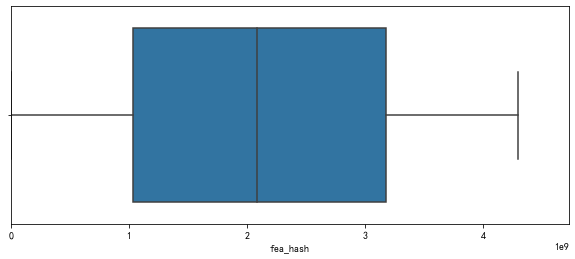

In [56]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_train.fea_hash.min(), df_train.fea_hash.max()*1.1)
sns.boxplot(x=df_train.fea_hash)
plt.show()

### 16.fea1_hash

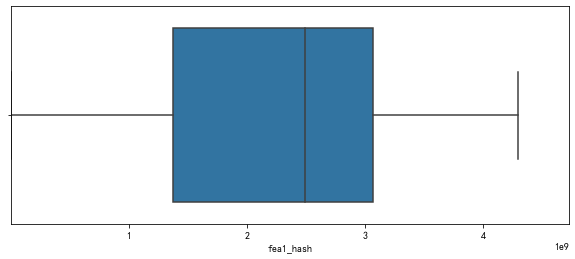

In [60]:
plt.figure(figsize=(10,4))
# x轴坐标范围
plt.xlim(df_train.fea1_hash.min(), df_train.fea1_hash.max()*1.1)
sns.boxplot(x=df_train.fea1_hash)
plt.show()

In [72]:
set4=set(df_train.fea1_hash.value_counts().head(500).index)
def process_fea1_hash(x):
    if x in set4:
        return x
    else:
        return -1

In [73]:
df_train.fea1_hash=df_train.fea1_hash.apply(process_fea1_hash)
df_test.fea1_hash=df_test.fea1_hash.apply(process_fea1_hash)

In [74]:
# cross_col("fea1_hash")

只存在test里: []
只存在train里: []


In [75]:
from sklearn import preprocessing
le9 = preprocessing.LabelEncoder()

df_train.fea1_hash=le9.fit_transform(df_train.fea1_hash)
df_train["fea1_hash"]=df_train["fea1_hash"].astype("object")

df_test.fea1_hash=le9.transform(df_test.fea1_hash)
df_test["fea1_hash"]=df_test["fea1_hash"].astype("object")

### 17.cus_type

In [76]:
cross_col("cus_type")

只存在test里: []
只存在train里: []


In [79]:
from sklearn import preprocessing
le10 = preprocessing.LabelEncoder()

df_train.cus_type=le10.fit_transform(df_train.cus_type)
df_train["cus_type"]=df_train["cus_type"].astype("object")

df_test.cus_type=le10.transform(df_test.cus_type)
df_test["cus_type"]=df_test["cus_type"].astype("object")

In [80]:
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
label,int64,500000.0,0,,0,1,0,0,1,,
osv,int64,500000.0,0,,0,9,6,8,8,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
Day,int64,500000.0,0,,2,9,4,6,8,,
Hour,int64,500000.0,0,,0,23,5,10,14,,
minute,int64,500000.0,0,,0,59,14,29,44,,
dev_height,float64,500000.0,0,,0,9024,720,1280,2040,,
dev_ppi,float64,500000.0,0,,0,720,0,0,0,,
dev_width,float64,500000.0,0,,0,8832,360,720,1080,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,


In [81]:
summary_stats_table(df_test)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
osv,int64,150000.0,0,,0,9,6,8,8,,
fea_hash,int64,150000.0,0,,0,4.29492e+09,1.02766e+09,2.08538e+09,3.18382e+09,,
Day,int64,150000.0,0,,2,9,4,6,8,,
Hour,int64,150000.0,0,,0,23,5,10,14,,
minute,int64,150000.0,0,,0,59,14,29,44,,
dev_height,float64,150000.0,0,,0,8512,720,1280,2038,,
dev_ppi,float64,150000.0,0,,0,640,0,0,0,,
dev_width,float64,150000.0,0,,0,9024,360,720,1080,,
timestamp,float64,150000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,150000.0,0,332,,,,,,49,4496


In [83]:
# df_train.to_pickle("./processed_data/df_train.pkl")
# df_test.to_pickle("./processed_data/df_test.pkl")

## 二、构造用户特征

In [1]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc
from collections import Counter
import re
from sklearn import preprocessing

In [2]:
df_train=pd.read_pickle("./processed_data/df_train.pkl")
df_test=pd.read_pickle("./processed_data/df_test.pkl")

In [3]:
def summary_stats_table(data):
    '''
    祖传代码：分类型按列的数据分布与异常值统计
    '''
    # 空值数量
    missing_counts = pd.DataFrame(data.isnull().sum())
    missing_counts.columns = ['count_null']

    # 数值列数据分布统计
    num_stats = data.select_dtypes(include=['int64','float64','int32']).describe().loc[['count','min','max','25%','50%','75%']].transpose()
    num_stats['dtype'] = data.select_dtypes(include=['int64','float64','int32']).dtypes.tolist()

    # 非数值列数据分布统计
    non_num_stats = data.select_dtypes(exclude=['int64','float64','int32']).describe().transpose()
    non_num_stats['dtype'] = data.select_dtypes(exclude=['int64','float64','int32']).dtypes.tolist()
    non_num_stats = non_num_stats.rename(columns={"first": "min", "last": "max"})

    # 聚合结果
    stats_merge = pd.concat([num_stats, non_num_stats], axis=0, join='outer', ignore_index=False, keys=None,
              levels=None, names=None, verify_integrity=False, copy=True, sort=False).fillna("").sort_values('dtype')

    column_order = ['dtype', 'count', 'count_null','unique','min','max','25%','50%','75%','top','freq']
    summary_stats = pd.merge(stats_merge, missing_counts, left_index=True, right_index=True, sort=False)[column_order]
    return(summary_stats)

In [4]:
summary_stats_table(df_train)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
label,int64,500000.0,0,,0,1,0,0,1,,
osv,int64,500000.0,0,,0,9,6,8,8,,
fea_hash,int64,500000.0,0,,0,4.29494e+09,1.03451e+09,2.08719e+09,3.17491e+09,,
Day,int64,500000.0,0,,2,9,4,6,8,,
Hour,int64,500000.0,0,,0,23,5,10,14,,
minute,int64,500000.0,0,,0,59,14,29,44,,
dev_height,float64,500000.0,0,,0,9024,720,1280,2040,,
dev_ppi,float64,500000.0,0,,0,720,0,0,0,,
dev_width,float64,500000.0,0,,0,8832,360,720,1080,,
timestamp,float64,500000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,


In [5]:
summary_stats_table(df_test)

,dtype,count,count_null,unique,min,max,25%,50%,75%,top,freq
osv,int64,150000.0,0,,0,9,6,8,8,,
fea_hash,int64,150000.0,0,,0,4.29492e+09,1.02766e+09,2.08538e+09,3.18382e+09,,
Day,int64,150000.0,0,,2,9,4,6,8,,
Hour,int64,150000.0,0,,0,23,5,10,14,,
minute,int64,150000.0,0,,0,59,14,29,44,,
dev_height,float64,150000.0,0,,0,8512,720,1280,2038,,
dev_ppi,float64,150000.0,0,,0,640,0,0,0,,
dev_width,float64,150000.0,0,,0,9024,360,720,1080,,
timestamp,float64,150000.0,0,,1.55949e+12,1.5601e+12,1.55966e+12,1.55982e+12,1.55996e+12,,
location,object,150000.0,0,332,,,,,,49,4496


In [16]:
user=pd.DataFrame()
user["uid"]=df_train.groupby("android_id").count().index
user=user.set_index("uid")

In [17]:
user.head()

""
uid
0
4
7
12
13


### 用户 most ,freq特征

In [ ]:
# from scipy import stats
# df_train.select_dtypes(exclude=['int64','float64']).groupby("android_id")["version"].agg(lambda x: stats.mode(x)[0][0]).reset_index()
# groupby.apply(lambda x: collections.Counter.most_common(x)[0])
# https://zhuanlan.zhihu.com/p/76285342

In [18]:
def most1(x):
    # ind,freq=Counter(x).most_common(1)[0]
    return Counter(x).most_common(1)[0][0]
def most2(x):
    # ind,freq=Counter(x).most_common(1)[0]
    return Counter(x).most_common(1)[0][1]

In [12]:
def uid_most_freq(df,col):
    print("start: {}_most_index".format(col) ) #30s
    name="{}_most_index".format(col)
    df[name]=df_train.groupby("android_id")[col].apply(most1)
    print("start: {}_most_freq".format(col) ) #30s
    name="{}_most_freq".format(col)
    df[name]=df_train.groupby("android_id")[col].apply(most2)
    return df

In [ ]:
# user=uid_most_freq(user,"package") # 测试

In [14]:
df_train.columns

Index(['android_id', 'apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'label', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute'],
      dtype='object')

### 提取需要most和freq的列：

[['apptype','carrier','lan','media_id', 'ntt', 'os', 'osv', 'package','version', 'location', 'fea1_hash', 'cus_type','Day', 'Hour']]

In [19]:
freq_columns=['apptype','carrier','lan','media_id', 'ntt', 'os', 'osv', 'package','version', 'location', 'fea1_hash', 'cus_type','Day', 'Hour']
for col in freq_columns:
    user=uid_most_freq(user,col)

start: apptype_most_index
start: apptype_most_freq
start: carrier_most_index
start: carrier_most_freq
start: lan_most_index
start: lan_most_freq
start: media_id_most_index
start: media_id_most_freq
start: ntt_most_index
start: ntt_most_freq
start: os_most_index
start: os_most_freq
start: osv_most_index
start: osv_most_freq
start: package_most_index
start: package_most_freq
start: version_most_index
start: version_most_freq
start: location_most_index
start: location_most_freq
start: fea1_hash_most_index
start: fea1_hash_most_freq
start: cus_type_most_index
start: cus_type_most_freq
start: Day_most_index
start: Day_most_freq
start: Hour_most_index
start: Hour_most_freq


### 提取需要min,max,mean,median,nunique的列：

In [24]:
def uid_stat(df,col):
    print("start: {}_min".format(col) ) #30s
    name="{}_min".format(col)
    df[name]=df_train.groupby("android_id")[col].min()

    print("start: {}_max".format(col) ) #30s
    name="{}_max".format(col)
    df[name]=df_train.groupby("android_id")[col].max()

    print("start: {}_mean".format(col) ) #30s
    name="{}_mean".format(col)
    df[name]=df_train.groupby("android_id")[col].mean()

    print("start: {}_median".format(col) ) #30s
    name="{}_median".format(col)
    df[name]=df_train.groupby("android_id")[col].median()

    print("start: {}_nunique".format(col) ) #30s
    name="{}_nunique".format(col)
    df[name]=df_train.groupby("android_id")[col].nunique()
    return df

In [26]:
numer_col=["dev_height","dev_ppi","dev_width","fea_hash","timestamp"]
for col in numer_col:
    user=uid_stat(user,col)

start: dev_height_min
start: dev_height_max
start: dev_height_mean
start: dev_height_median
start: dev_height_nunique
start: dev_ppi_min
start: dev_ppi_max
start: dev_ppi_mean
start: dev_ppi_median
start: dev_ppi_nunique
start: dev_width_min
start: dev_width_max
start: dev_width_mean
start: dev_width_median
start: dev_width_nunique
start: fea_hash_min
start: fea_hash_max
start: fea_hash_mean
start: fea_hash_median
start: fea_hash_nunique
start: timestamp_min
start: timestamp_max
start: timestamp_mean
start: timestamp_median
start: timestamp_nunique


In [27]:
user

,apptype_most_index,apptype_most_freq,carrier_most_index,carrier_most_freq,lan_most_index,lan_most_freq,media_id_most_index,media_id_most_freq,ntt_most_index,ntt_most_freq,...,fea_hash_min,fea_hash_max,fea_hash_mean,fea_hash_median,fea_hash_nunique,timestamp_min,timestamp_max,timestamp_mean,timestamp_median,timestamp_nunique
uid,,,,,,,,,,,,,,,,,,,,,
0,48,87740,1,125850,9,86989,6,87244,1,79745,...,22826,4294927914,2.119359e+09,2.102647e+09,113871,1.559491e+12,1.560096e+12,1.559814e+12,1.559815e+12,126686
4,68,1,1,1,2,1,5,1,1,1,...,4039642748,4039642748,4.039643e+09,4.039643e+09,1,1.559570e+12,1.559570e+12,1.559570e+12,1.559570e+12,1
7,4,1,1,1,9,1,9,1,2,1,...,3541087861,3541087861,3.541088e+09,3.541088e+09,1,1.560058e+12,1.560058e+12,1.560058e+12,1.560058e+12,1
12,38,1,1,1,9,1,12,1,5,1,...,4095240415,4095240415,4.095240e+09,4.095240e+09,1,1.560062e+12,1.560062e+12,1.560062e+12,1.560062e+12,1
13,62,1,2,1,9,1,13,1,1,1,...,1020508477,1020508477,1.020508e+09,1.020508e+09,1,1.560038e+12,1.560038e+12,1.560038e+12,1.560038e+12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
709888,81,1,1,1,3,1,20,1,5,1,...,1150488682,1150488682,1.150489e+09,1.150489e+09,1,1.559577e+12,1.559577e+12,1.559577e+12,1.559577e+12,1
709891,83,1,2,1,7,1,7,1,1,1,...,541302052,541302052,5.413021e+08,5.413021e+08,1,1.559512e+12,1.559512e+12,1.559512e+12,1.559512e+12,1
709892,7,1,1,1,9,1,0,1,1,1,...,51759031,51759031,5.175903e+07,5.175903e+07,1,1.559495e+12,1.559495e+12,1.559495e+12,1.559495e+12,1


In [29]:
user.to_pickle("./processed_data/user_train.pkl")

In [30]:
del user

#### user_test

In [31]:
user_test=pd.DataFrame()
user_test["uid"]=df_test.groupby("android_id").count().index
user_test=user_test.set_index("uid")

In [33]:
user_test.head()

""
uid
0
9
11
22
24


### test_用户 most ,freq特征

In [34]:
def most1(x):
    # ind,freq=Counter(x).most_common(1)[0]
    return Counter(x).most_common(1)[0][0]
def most2(x):
    # ind,freq=Counter(x).most_common(1)[0]
    return Counter(x).most_common(1)[0][1]

In [35]:
def uid_most_freq_test(df,col):
    print("start: {}_most_index".format(col) ) #30s
    name="{}_most_index".format(col)
    df[name]=df_test.groupby("android_id")[col].apply(most1)
    print("start: {}_most_freq".format(col) ) #30s
    name="{}_most_freq".format(col)
    df[name]=df_test.groupby("android_id")[col].apply(most2)
    return df

In [37]:
freq_columns=['apptype','carrier','lan','media_id', 'ntt', 'os', 'osv', 'package','version', 'location', 'fea1_hash', 'cus_type','Day', 'Hour']
for col in freq_columns:
    user_test=uid_most_freq_test(user_test,col)

start: apptype_most_index
start: apptype_most_freq
start: carrier_most_index
start: carrier_most_freq
start: lan_most_index
start: lan_most_freq
start: media_id_most_index
start: media_id_most_freq
start: ntt_most_index
start: ntt_most_freq
start: os_most_index
start: os_most_freq
start: osv_most_index
start: osv_most_freq
start: package_most_index
start: package_most_freq
start: version_most_index
start: version_most_freq
start: location_most_index
start: location_most_freq
start: fea1_hash_most_index
start: fea1_hash_most_freq
start: cus_type_most_index
start: cus_type_most_freq
start: Day_most_index
start: Day_most_freq
start: Hour_most_index
start: Hour_most_freq


### 提取需要min,max,mean,median,nunique的列：

In [38]:
def uid_stat_test(df,col):
    print("start: {}_min".format(col) ) #30s
    name="{}_min".format(col)
    df[name]=df_test.groupby("android_id")[col].min()

    print("start: {}_max".format(col) ) #30s
    name="{}_max".format(col)
    df[name]=df_test.groupby("android_id")[col].max()

    print("start: {}_mean".format(col) ) #30s
    name="{}_mean".format(col)
    df[name]=df_test.groupby("android_id")[col].mean()

    print("start: {}_median".format(col) ) #30s
    name="{}_median".format(col)
    df[name]=df_test.groupby("android_id")[col].median()

    print("start: {}_nunique".format(col) ) #30s
    name="{}_nunique".format(col)
    df[name]=df_test.groupby("android_id")[col].nunique()
    return df

In [39]:
numer_col=["dev_height","dev_ppi","dev_width","fea_hash","timestamp"]
for col in numer_col:
    user_test=uid_stat(user_test,col)

start: dev_height_min
start: dev_height_max
start: dev_height_mean
start: dev_height_median
start: dev_height_nunique
start: dev_ppi_min
start: dev_ppi_max
start: dev_ppi_mean
start: dev_ppi_median
start: dev_ppi_nunique
start: dev_width_min
start: dev_width_max
start: dev_width_mean
start: dev_width_median
start: dev_width_nunique
start: fea_hash_min
start: fea_hash_max
start: fea_hash_mean
start: fea_hash_median
start: fea_hash_nunique
start: timestamp_min
start: timestamp_max
start: timestamp_mean
start: timestamp_median
start: timestamp_nunique


In [40]:
user_test

,apptype_most_index,apptype_most_freq,carrier_most_index,carrier_most_freq,lan_most_index,lan_most_freq,media_id_most_index,media_id_most_freq,ntt_most_index,ntt_most_freq,...,fea_hash_min,fea_hash_max,fea_hash_mean,fea_hash_median,fea_hash_nunique,timestamp_min,timestamp_max,timestamp_mean,timestamp_median,timestamp_nunique
uid,,,,,,,,,,,,,,,,,,,,,
0,48,26353,1,37969,9,26121,6,26215,1,24120,...,22826.0,4.294928e+09,2.119359e+09,2.102647e+09,113871.0,1.559491e+12,1.560096e+12,1.559814e+12,1.559815e+12,126686.0
9,12,1,1,1,7,1,11,1,5,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,31,1,0,1,7,1,4,1,5,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,31,1,-1,1,7,1,17,1,5,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,36,1,1,1,7,1,18,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
709873,43,1,1,1,9,1,48,1,5,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
709877,31,1,0,1,7,1,10,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
709884,58,1,2,1,9,1,41,1,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
gc.collect()

60

In [42]:
user_test.to_pickle("./processed_data/user_test.pkl")

## classfication(初步)

In [1]:
import lightgbm as lgb
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
import datetime
import seaborn as sns
plt.rcParams['font.sans-serif']=['SimHei']
plt.rcParams['axes.unicode_minus'] = False
import gc
from collections import Counter
from sklearn.model_selection import GroupKFold, KFold, StratifiedKFold
from sklearn.model_selection import GridSearchCV
import re
from sklearn import preprocessing

In [2]:
feature_train=pd.read_pickle("./processed_data/df_train.pkl")
feature_test=pd.read_pickle("./processed_data/df_test.pkl")
user_train=pd.read_pickle("./processed_data/user_train.pkl")
user_test=pd.read_pickle("./processed_data/user_test.pkl")
feature_test["label"]=0

#### 融合user 信息

In [16]:
feature_train=pd.merge(feature_train,user_train,left_on="android_id",right_on="uid",how="left",right_index=True)

In [14]:
feature_test=pd.merge(feature_test,user_test,left_on="android_id",right_on="uid",how="left",right_index=True)

In [17]:
feature_train.columns

Index(['android_id', 'apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'label', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute', 'apptype_most_index', 'apptype_most_freq',
       'carrier_most_index', 'carrier_most_freq', 'lan_most_index',
       'lan_most_freq', 'media_id_most_index', 'media_id_most_freq',
       'ntt_most_index', 'ntt_most_freq', 'os_most_index', 'os_most_freq',
       'osv_most_index', 'osv_most_freq', 'package_most_index',
       'package_most_freq', 'version_most_index', 'version_most_freq',
       'location_most_index', 'location_most_freq', 'fea1_hash_most_index',
       'fea1_hash_most_freq', 'cus_type_most_index', 'cus_type_most_freq',
       'Day_most_index', 'Day_most_freq', 'Hour_most_index', 'Hour_most_freq',
       'dev_height_min', 'dev_height_max', 'dev_height_mean',
       'dev_height_median', 'dev_height_nunique', 'dev_ppi_

In [18]:
feature_test.columns

Index(['android_id', 'apptype', 'carrier', 'dev_height', 'dev_ppi',
       'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
       'timestamp', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour', 'minute', 'label', 'apptype_most_index',
       'apptype_most_freq', 'carrier_most_index', 'carrier_most_freq',
       'lan_most_index', 'lan_most_freq', 'media_id_most_index',
       'media_id_most_freq', 'ntt_most_index', 'ntt_most_freq',
       'os_most_index', 'os_most_freq', 'osv_most_index', 'osv_most_freq',
       'package_most_index', 'package_most_freq', 'version_most_index',
       'version_most_freq', 'location_most_index', 'location_most_freq',
       'fea1_hash_most_index', 'fea1_hash_most_freq', 'cus_type_most_index',
       'cus_type_most_freq', 'Day_most_index', 'Day_most_freq',
       'Hour_most_index', 'Hour_most_freq', 'dev_height_min', 'dev_height_max',
       'dev_height_mean', 'dev_height_median', 'dev_height_nunique',
       'd

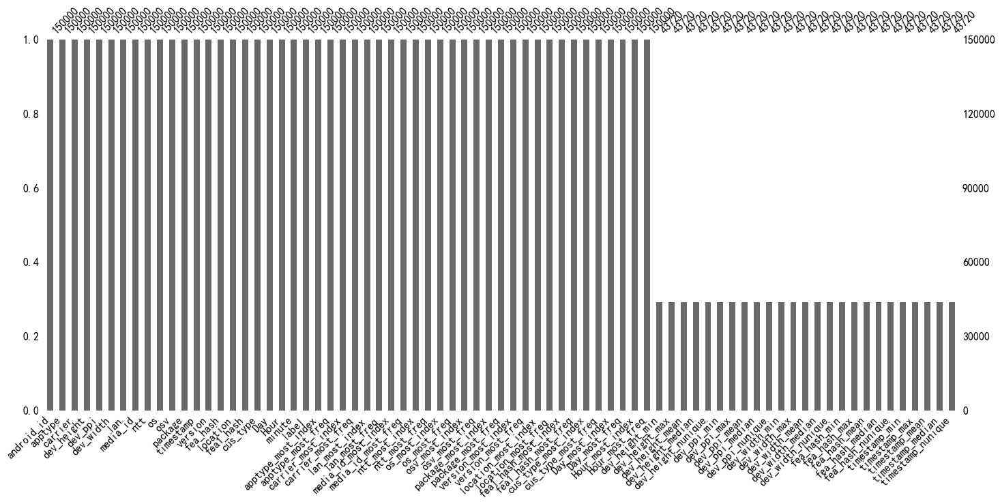

In [50]:
msno.bar(feature_test,labels=True)

### define

In [218]:
cate_feature = ["apptype", "carrier", "lan","media_id","ntt", "os", "package", "version", "location", "fea1_hash", "cus_type"]
for item in cate_feature:
    le=preprocessing.LabelEncoder()
    feature_train[item] = le.fit_transform(feature_train[item])
    feature_test[item] = le.transform(feature_test[item])

# prediction = feature_test[['apptype', 'carrier', 'dev_height', 'dev_ppi','timestamp',
#        'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
#        'Day', 'Hour', 'apptype_most_index', 'apptype_most_freq', 'carrier_most_index', 'carrier_most_freq',
#        'lan_most_index', 'lan_most_freq', 'media_id_most_index',
#        'media_id_most_freq', 'ntt_most_index', 'ntt_most_freq',
#        'os_most_index', 'os_most_freq', 'osv_most_index', 'osv_most_freq',
#        'package_most_index', 'package_most_freq', 'version_most_index',
#        'version_most_freq', 'location_most_index', 'location_most_freq',
#        'fea1_hash_most_index', 'fea1_hash_most_freq', 'cus_type_most_index',
#        'cus_type_most_freq', 'Day_most_index', 'Day_most_freq',
#        'Hour_most_index', 'Hour_most_freq']]
prediction = feature_test[['apptype', 'carrier', 'dev_height', 'dev_ppi','timestamp',
       'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour']]


prediction['label'] = 0


y_col = 'label'
x_col=['apptype', 'carrier', 'dev_height', 'dev_ppi','timestamp',
       'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package', 'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
       'Day', 'Hour']
# x_col = ['apptype', 'carrier', 'dev_height', 'dev_ppi','timestamp',
#        'dev_width', 'lan', 'media_id', 'ntt', 'os', 'osv', 'package',
#        'version', 'fea_hash', 'location', 'fea1_hash', 'cus_type',
#        'Day', 'Hour', 'apptype_most_index', 'apptype_most_freq',
#        'carrier_most_index', 'carrier_most_freq', 'lan_most_index',
#        'lan_most_freq', 'media_id_most_index', 'media_id_most_freq',
#        'ntt_most_index', 'ntt_most_freq', 'os_most_index', 'os_most_freq',
#        'osv_most_index', 'osv_most_freq', 'package_most_index',
#        'package_most_freq', 'version_most_index', 'version_most_freq',
#        'location_most_index', 'location_most_freq']

model = lgb.LGBMClassifier(
    boosting_type='gbdt',
                           num_leaves=50,
                           max_depth=7,
                           learning_rate=0.03,
                           n_estimators=10000,
                           subsample=0.8,
                           feature_fraction=0.8,
                           reg_alpha=0.8,
                           reg_lambda=0.8,
                           random_state=220,
                           metric=None,
                           n_jobs=-1
                           )

In [219]:
oof = []
df_importance_list = []
n=10
kfold = KFold(n_splits=n,shuffle=True,random_state=20)
for fold_id, (trn_idx, val_idx) in enumerate(kfold.split(feature_train[x_col], feature_train[y_col])):
    X_train = feature_train.iloc[trn_idx][x_col]
    Y_train = feature_train.iloc[trn_idx][y_col]

    X_val = feature_train.iloc[val_idx][x_col]
    Y_val = feature_train.iloc[val_idx][y_col]

    print('\nFold_{} Training ================================\n'.format(fold_id+1))

    lgb_model = model.fit(
        X_train,
        Y_train,
        eval_names=['train', 'valid'],
        eval_set=[(X_train, Y_train), (X_val, Y_val)],
        verbose=100,
        eval_metric=["auc","acc"],
        early_stopping_rounds=200
    )

    pred_val = lgb_model.predict_proba(X_val, num_iteration=lgb_model.best_iteration_)[:, 1]
    df_oof = feature_train.iloc[val_idx].copy()
    df_oof['pred'] = pred_val
    oof.append(df_oof)

    pred_test = lgb_model.predict_proba(feature_test[x_col], num_iteration=lgb_model.best_iteration_)[:, 1]
    prediction['label'] += pred_test / n

    df_importance = pd.DataFrame({
        'column': x_col,
        'importance': lgb_model.feature_importances_,
    })
    df_importance_list.append(df_importance)


Fold_1 Training ================================

Training until validation scores don't improve for 200 rounds
[100]	train's auc: 0.931102	valid's auc: 0.930445
[200]	train's auc: 0.936362	valid's auc: 0.935408
[300]	train's auc: 0.938869	valid's auc: 0.937633
[400]	train's auc: 0.94046	valid's auc: 0.93892
[500]	train's auc: 0.941721	valid's auc: 0.939739
[600]	train's auc: 0.942738	valid's auc: 0.940234
[700]	train's auc: 0.943598	valid's auc: 0.940645
[800]	train's auc: 0.944396	valid's auc: 0.940929
[900]	train's auc: 0.945194	valid's auc: 0.941183
[1000]	train's auc: 0.945922	valid's auc: 0.941412
[1100]	train's auc: 0.946645	valid's auc: 0.941628
[1200]	train's auc: 0.947311	valid's auc: 0.941755
[1300]	train's auc: 0.947902	valid's auc: 0.941847
[1400]	train's auc: 0.948507	valid's auc: 0.94194
[1500]	train's auc: 0.949125	valid's auc: 0.942058
[1600]	train's auc: 0.949693	valid's auc: 0.942155
[1700]	train's auc: 0.950253	valid's auc: 0.942289
[1800]	train's auc: 0.950822	val

In [221]:
df_importance = pd.concat(df_importance_list)
df_importance = df_importance.groupby(['column'])['importance'].agg('mean').sort_values(ascending=False).reset_index()
df_importance

,column,importance
0,dev_height,13615.7
1,fea_hash,13281.5
2,location,13261.2
3,timestamp,12513.7
4,fea1_hash,9518.3
5,cus_type,9199.7
6,apptype,7571.6
7,Hour,6854.0
8,media_id,6438.5
9,package,6395.6


In [222]:
prediction

,apptype,carrier,dev_height,dev_ppi,timestamp,dev_width,lan,media_id,ntt,os,osv,package,version,fea_hash,location,fea1_hash,cus_type,Day,Hour,label
sid,,,,,,,,,,,,,,,,,,,,
1440682,78,2,2196.0,2.0,1.559872e+12,1080.0,0,0,1,0,8,132,12,1672223856,58,448,19,7,1,0.063317
1606824,41,4,2280.0,3.0,1.559739e+12,1080.0,9,0,5,0,8,145,7,3767901757,24,14,34,5,12,0.730233
1774642,68,2,0.0,0.0,1.559614e+12,0.0,7,8,1,1,5,0,1,454638703,31,483,6,4,2,0.021206
1742535,12,2,1344.0,0.0,1.559668e+12,720.0,7,11,1,1,7,10,1,1507622951,66,403,29,4,17,0.060700
1689686,48,2,665.0,0.0,1.559694e+12,320.0,9,6,4,0,8,5,1,4116351093,149,328,6,5,0,0.958546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1165373,48,2,760.0,0.0,1.559957e+12,360.0,9,6,1,0,8,5,1,3162887451,127,341,6,8,1,0.941592
1444115,48,2,780.0,0.0,1.559863e+12,360.0,9,6,1,0,9,5,1,97238959,323,336,6,6,23,0.973934
1134378,48,2,780.0,0.0,1.560041e+12,360.0,9,6,4,0,8,5,1,1320118495,47,323,6,9,0,0.934060


In [238]:
a = pd.DataFrame(prediction.index)
a['label'] = lgb_model.predict(prediction[x_col])

In [203]:
# a.to_csv('submission_0528_0136.csv', index=False)

In [224]:
a

,sid,label
0,1440682,0
1,1606824,1
2,1774642,0
3,1742535,0
4,1689686,1
...,...,...
149995,1165373,1
149996,1444115,1
149997,1134378,1
149998,1700238,1


In [239]:
c=a.copy()

In [240]:
user_label=pd.DataFrame()
user_label["uid"]=feature_train.groupby("android_id").count().index
user_label=user_label.set_index("uid")

In [241]:
user_label["label_prior"]=feature_train.groupby("android_id").label.mean()

In [242]:
user_label

,label_prior
uid,
0,0.594099
4,1.000000
7,1.000000
12,0.000000
13,1.000000
...,...
709888,1.000000
709891,0.000000
709892,1.000000


In [243]:
a["uid"]=feature_test.android_id.values

In [244]:
a=pd.merge(a,user_label,on="uid",how="left")

In [245]:
a

,sid,label,uid,label_prior
0,1440682,0,317625,NaN
1,1606824,1,435108,NaN
2,1774642,0,0,0.594099
3,1742535,0,451504,0.000000
4,1689686,1,0,0.594099
...,...,...,...,...
149995,1165373,1,0,0.594099
149996,1444115,1,0,0.594099
149997,1134378,1,0,0.594099
149998,1700238,1,500925,NaN


In [246]:
def post(label,prior):
    n=len(label)
    count=0
    for i in range(n):
        if 0<=prior[i]<=0.1 and label[i]==1:
            label[i]=0
            count+=1
            print(i)
        elif 0.9<=prior[i]<=1 and label[i]==0:
            label[i]=1
            count+=1
            print(i)
        else:
            pass
    print(count)
    return label.values

In [247]:
a.label=post(a.label,a.label_prior)

332
998
1642
2022
2119
2396
2426
2466
2840
2916
3105
3290
4496
4620
4771
4838
5208
5978
6567
6942
7609
8244
8278
8837
9326
9986
11214
12158
13045
13260
13476
13686
14758
14855
15250
15871
15899
17452
17678
18142
18577
19046
19069
19076
19355
19441
19730
19767
19941
20654
21895
21941
22045
22192
22470
22628
23321
23920
24440
24514
25781
26671
26946
27063
27588
27776
27842
28054
28573
28584
29207
29456
29524
29705
30662
30760
31770
32715
32763
32812
33215
33383
33617
34735
34806
35474
36118
36224
36310
36764
37096
37348
37768
39576
39714
40008
40329
41907
42092
43233
43262
43265
43573
43701
44149
44267
44369
44482
44534
44686
45094
45539
45604
45692
46645
47068
47214
47335
47377
47611
47959
48065
48563
49176
49352
50126
50372
50478
51414
52034
52717
52883
53273
53412
53481
54110
55006
55476
55709
55811
56053
57443
57446
57903
58054
58207
58304
58412
59544
59672
59706
60107
60371
60472
61785
62932
63142
63311
63921
64442
64525
65497
65608
66542
66904
66916
67112
67601
67663
67996
68145
68

In [235]:
gc.collect()

124

In [236]:
a=a[["sid","label"]]

In [237]:
a.to_csv('submission_0528_0249.csv', index=False)